### LSE Data Analytics Online Career Accelerator

# DA201: Data Analytics using Python

## Assignment Notebook: COVID-19 data
## Nikki Stopford

## Student Note
This template can be used to better understand the suggested assignment workflow and how to approach the questions. You are welcome to add code and Markdown blocks to the various sections to add either code or comments. Make sure to add code cells as applicable, and to comment all your code blocks.

You have the option to populate your Notebook with all the elements typically contained within the report, or to submit a separate report. In the case of submitting your Notebook, you can embed images, links and text where appropriate in addition to the text notes added.

**SPECIAL NOTE**
- Submit your Jupyter Notebook with the following naming convention: `LSE_DA201_assignment_[your name]_[your surname]` (remove the square brackets).
- You should submit a zipped folder containing all the elements used in your Notebook (data files, images, etc.).

> ***Markdown notes:*** Remember to change cell types to `Markdown`. You can review [Markdown basics](https://docs.github.com/en/get-started/writing-on-github/getting-started-with-writing-and-formatting-on-github/basic-writing-and-formatting-syntax) to find out how to add formatted text, links and images to your Markdown documents.

## 0) Environment preparation
These settings are provided for you. You do not need to make any changes.

In [94]:
# Import the required libraries and set the plotting options
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc = {'figure.figsize':(15,10)})

### Required: Report submission:

- [My Github Repo](https://github.com/BooBN1/LSE_DA_COVID_analysis)

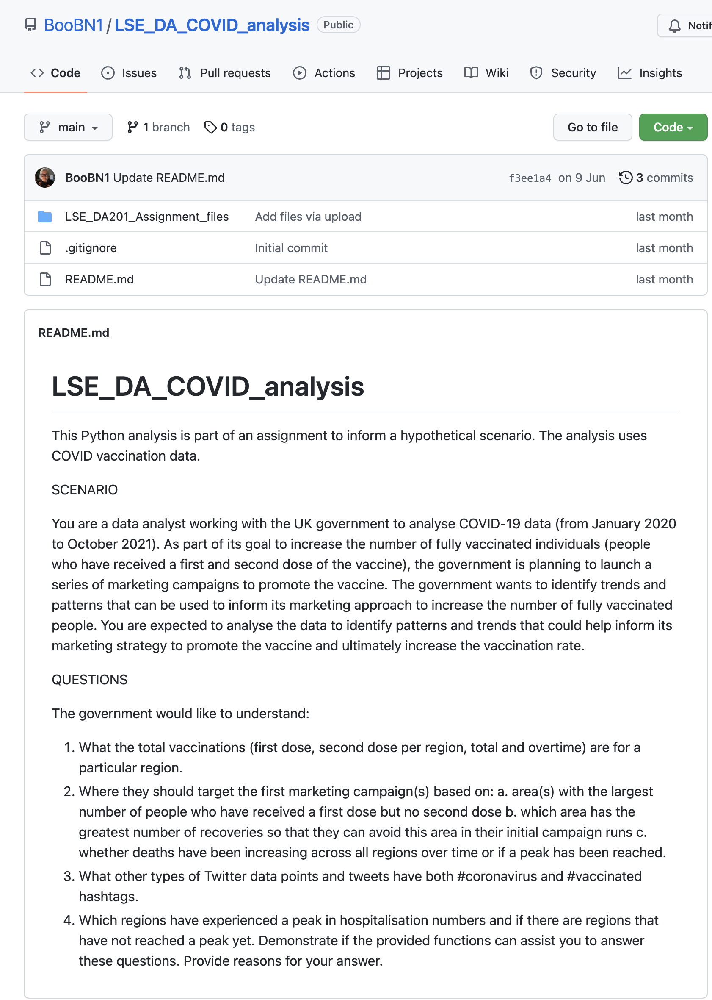

### 1.2) Presentation expectations:
- Describe the role and how workflow tools such as GitHub can be used to add value to organisations.

**NS NOTES FOR PRESENTATION**
- GitHub is the software tool that is being used to manage the source code for this analysis.
- As a distributed Version Control System (VCS), we will use a GitHub repo for storing all the data and the code for the analysis, it will enable others in the team to effectively collaborate on this project and help us track changes.
- The benefits of GitHub are that it's a stable and well-supported VCS; making it a reliable place to store and manage the code.

## 2) Assignment activity 2: 

### 2.1) Report expectations:
- Load the files `covid_19_uk_cases.csv` and `covid_19_uk_vaccinated.csv` and explore the data.
- Explore the data using the `info()`, `describe()`, `shape` and `value_counts()` methods, and note the observations regarding data types, number or records and features.
- Identify missing data.
- Filter/subset data.
- Aggregate data (totals and by month).
- Note observations.

In [1]:
# Load the COVID-19 cases and vaccine data sets as cov and vac respectively

In [2]:
# Import pandas
import pandas as pd

# Load data files
cov = pd.read_csv('covid_19_uk_cases.csv')
vac = pd.read_csv('covid_19_uk_vaccinated.csv')

In [3]:
# Explore the DataFrames with the appropriate functions

In [21]:
# View basic shape of the cases data by counting rows and columns and determine datatypes
print(cov.shape)
print(cov.dtypes)

cov

(2, 12)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
dtype: object


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
875,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-21,NaN,NaN,NaN,NaN
876,Bermuda,United Kingdom,32.3078,-64.7505,BMU,Northern America,0,2020-09-22,NaN,NaN,NaN,NaN


In [6]:
# View basic shape of the vaccinated data by counting rows and columns and determine datatypes
print(vac.shape)
print(vac.dtypes)

vac

(7584, 11)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
7579,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-10,1070,1216,1070
7580,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-11,1300,1604,1300
7581,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-12,1482,2027,1482
7582,Others,United Kingdom,55.3781,-3.4360,GBR,Northern Europe,0,2021-10-13,0,0,0


**OBSERVATIONS**:
- The 'Date' column is currently recorded as an object data type. 
- It's not yet clear yet whether different formats have been used for different regions. 
- I will need to import the DataTime module to manipulate the Date class.

In [5]:
# Code to initiate a date object 
import datetime
d = datetime.date(2021, 6, 10)

print(d)
print(type(d))

2021-06-10
<class 'datetime.date'>


In [7]:
# View in the DataFrame the first and last five rows for the cases data.

# View first five roles
print(cov.head())

# View the last five rows.
print(cov.tail())

  Province/State  Country/Region      Lat     Long ISO 3166-1 Alpha 3-Codes  \
0       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
1       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
2       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
3       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
4       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   

                   Sub-region Name  Intermediate Region Code        Date  \
0  Latin America and the Caribbean                        29  2020-01-22   
1  Latin America and the Caribbean                        29  2020-01-23   
2  Latin America and the Caribbean                        29  2020-01-24   
3  Latin America and the Caribbean                        29  2020-01-25   
4  Latin America and the Caribbean                        29  2020-01-26   

   Deaths  Cases  Recovered  Hospitalised  
0     0.0    0.0        

In [13]:
# View in the DataFrame the first and last five rows for the vaccination data.

# View first five roles
print(vac.head())

# View the last five rows.
print(vac.tail())

  Province/State  Country/Region      Lat     Long ISO 3166-1 Alpha 3-Codes  \
0       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
1       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
2       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
3       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   
4       Anguilla  United Kingdom  18.2206 -63.0686                      AIA   

                   Sub-region Name  Intermediate Region Code        Date  \
0  Latin America and the Caribbean                        29  2020-01-22   
1  Latin America and the Caribbean                        29  2020-01-23   
2  Latin America and the Caribbean                        29  2020-01-24   
3  Latin America and the Caribbean                        29  2020-01-25   
4  Latin America and the Caribbean                        29  2020-01-26   

   Vaccinated  First Dose  Second Dose  
0           0           0  

In [17]:
# Check for missing values for the cases data
cov = cov[cov.isnull().any(axis=1)]

cov.shape

(2, 12)

In [18]:
#Determine the sum missing values for the cases data
cov.isnull().sum()

Province/State              0
Country/Region              0
Lat                         0
Long                        0
ISO 3166-1 Alpha 3-Codes    0
Sub-region Name             0
Intermediate Region Code    0
Date                        0
Deaths                      2
Cases                       2
Recovered                   2
Hospitalised                2
dtype: int64

In [19]:
#View rows where data is NAN
print(cov[cov['Deaths'].isnull()])

    Province/State  Country/Region      Lat     Long ISO 3166-1 Alpha 3-Codes  \
875        Bermuda  United Kingdom  32.3078 -64.7505                      BMU   
876        Bermuda  United Kingdom  32.3078 -64.7505                      BMU   

      Sub-region Name  Intermediate Region Code        Date  Deaths  Cases  \
875  Northern America                         0  2020-09-21     NaN    NaN   
876  Northern America                         0  2020-09-22     NaN    NaN   

     Recovered  Hospitalised  
875        NaN           NaN  
876        NaN           NaN  


In [107]:
# Check for missing values for the cases data
vac = vac[vac.isnull().any(axis=1)]

vac.shape

(0, 11)

**OBSERVATION**
- There are missing values in two rows of data in cases data file - these are both in the Bermuda Province/State. Where values for are missing across four columns (deaths, cases, recovered and hospitalised).
- There is no missing vaccination data.

In [35]:
# View min and max date in the full data set(note: does not equate to first cases)
print(cov['Date'].min())
print(cov['Date'].max())

2020-01-22
2021-10-14


In [36]:
# View min and max date in the full data set
print(vac['Date'].min())
print(vac['Date'].max())

2020-01-22
2021-10-14


In [37]:
# Import pandas
import pandas as pd

# Load full data file
cov = pd.read_csv('covid_19_uk_cases.csv')

# Filter Gibraltar data
gibraltar = cov[cov['Province/State']=='Gibraltar']

# View Gibraltar data
gibraltar

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0
3797,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-27,0.0,0.0,0.0,0.0
3798,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-28,0.0,0.0,0.0,0.0
3799,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-29,0.0,0.0,0.0,0.0
3800,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-30,0.0,0.0,0.0,0.0
3801,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-31,0.0,0.0,0.0,0.0


In [38]:
# print the whole DataFrame
pd.set_option("display.max_rows", None)

gibraltar 

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0.0,0.0,0.0,0.0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0.0,0.0,0.0,0.0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0.0,0.0,0.0,0.0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0.0,0.0,0.0,0.0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0.0,0.0,0.0,0.0
3797,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-27,0.0,0.0,0.0,0.0
3798,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-28,0.0,0.0,0.0,0.0
3799,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-29,0.0,0.0,0.0,0.0
3800,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-30,0.0,0.0,0.0,0.0
3801,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-31,0.0,0.0,0.0,0.0


In [39]:
# View a subset of Gibraltar data based on deaths, cases, recovered and hospitalised columns 
gib_limit = gibraltar[['Date', 'Deaths', 'Cases', 'Recovered', 'Hospitalised']]

# Change the index parameter to date
gib_limit = gib_limit.set_index('Date')

# View the subset of Gibraltar data
print(gib_limit)

            Deaths   Cases  Recovered  Hospitalised
Date                                               
2020-01-22     0.0     0.0        0.0           0.0
2020-01-23     0.0     0.0        0.0           0.0
2020-01-24     0.0     0.0        0.0           0.0
2020-01-25     0.0     0.0        0.0           0.0
2020-01-26     0.0     0.0        0.0           0.0
2020-01-27     0.0     0.0        0.0           0.0
2020-01-28     0.0     0.0        0.0           0.0
2020-01-29     0.0     0.0        0.0           0.0
2020-01-30     0.0     0.0        0.0           0.0
2020-01-31     0.0     0.0        0.0           0.0
2020-02-01     0.0     0.0        0.0           0.0
2020-02-02     0.0     0.0        0.0           0.0
2020-02-03     0.0     0.0        0.0           0.0
2020-02-04     0.0     0.0        0.0           0.0
2020-02-05     0.0     0.0        0.0           0.0
2020-02-06     0.0     0.0        0.0           0.0
2020-02-07     0.0     0.0        0.0           0.0
2020-02-08  

In [40]:
# Explore and note observations

In [41]:
# Generate descriptive stats for gibraltar data subset
gib_limit.describe()

,Deaths,Cases,Recovered,Hospitalised
count,632.000000,632.000000,632.000000,632.000000
mean,40.208861,2237.109177,1512.821203,1027.625000
std,45.332832,2136.268090,1817.096755,1145.681058
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,177.000000,109.500000,157.750000
50%,5.000000,1036.500000,323.500000,675.500000
75%,94.000000,4286.000000,4122.500000,1548.000000
max,97.000000,5727.000000,4670.000000,4907.000000


In [42]:
# View min and max date in the Gibralter(note: does not equate to first cases)
print(gibraltar['Date'].min())
print(gibraltar['Date'].max())

2020-01-22
2021-10-14


**OBSERVATIONS**: 
- Data for Gibraltar was collected over 632 days from 22 January 2020 to 14 October 2022 - this looks like it might be consistent with other regions given the min/max date values for the whole data set but this will need to be checked. 
- Across this time period (632 days), the average (mean) of daily cases is 2,337 in Gibraltar. However, the first case was not reported until 4 March 2020 so the average will be slightly higher if we were to convert the 0 to NAN. I have decided against doing this for the moment so we have a comparative measure across regions for the 632 days of data collection. 
- There have been a total of 97 deaths in Gibraltar. The first death reported was on 11 November 2020.
- The maximum daily cases were 5,727. This was recorded on the last date of data collection, which would indicate the peak hasn't yet been reached.
- There is missing data in the 'Recovered' column: data collection stops on 5 August 2021. This results in a significant three month gap in the data. I will need to review whether this is a consistent pattern in other regions (i.e. missing not at random - MNAR). If this is the case then, rather than trying to extrapolate the data based on other data (e.g. cases), I will treat it as unreliable and not use it as part of the analysis.

In [43]:
# Import pandas
import pandas as pd

# Load full data file
vac = pd.read_csv('covid_19_uk_vaccinated.csv')

# Filter Gibraltar data
gib_vac = vac[vac['Province/State']=='Gibraltar']

# View Gibraltar data
gib_vac

,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Vaccinated,First Dose,Second Dose
3792,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-22,0,0,0
3793,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-23,0,0,0
3794,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-24,0,0,0
3795,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-25,0,0,0
3796,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-26,0,0,0
3797,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-27,0,0,0
3798,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-28,0,0,0
3799,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-29,0,0,0
3800,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-30,0,0,0
3801,Gibraltar,United Kingdom,36.1408,-5.3536,GIB,Southern Europe,0,2020-01-31,0,0,0


In [44]:
# View a subset of Gibraltar vaccination data  
gib_vac_limit = gib_vac[['Date', 'Vaccinated', 'First Dose', 'Second Dose']]

# Change the index parameter to date
gib_vac_limit = gib_vac_limit.set_index('Date')

# View the subset of Gibraltar vaccination data
print(gib_vac_limit)

            Vaccinated  First Dose  Second Dose
Date                                           
2020-01-22           0           0            0
2020-01-23           0           0            0
2020-01-24           0           0            0
2020-01-25           0           0            0
2020-01-26           0           0            0
2020-01-27           0           0            0
2020-01-28           0           0            0
2020-01-29           0           0            0
2020-01-30           0           0            0
2020-01-31           0           0            0
2020-02-01           0           0            0
2020-02-02           0           0            0
2020-02-03           0           0            0
2020-02-04           0           0            0
2020-02-05           0           0            0
2020-02-06           0           0            0
2020-02-07           0           0            0
2020-02-08           0           0            0
2020-02-09           0           0      

In [45]:
# Generate descriptive stats for gibraltar data subset
gib_vac_limit.describe()

,Vaccinated,First Dose,Second Dose
count,632.000000,632.000000,632.000000
mean,8870.318038,9289.218354,8870.318038
std,15439.487761,16287.230372,15439.487761
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,14594.000000,12488.750000,14594.000000
max,69619.000000,94038.000000,69619.000000


In [46]:
print(gib_vac['Vaccinated'].sum())
print(gib_vac['First Dose'].sum())
print(gib_vac['Second Dose'].sum())

5606041
5870786
5606041


In [47]:
first_dose = gib_vac['First Dose'].sum()
second_dose = gib_vac['Second Dose'].sum()

print(first_dose - second_dose)

264745


**OBSERVATIONS**
- The 'Vaccinated' column shows that the number of people who are fully vaccinated (having received two doses). The shape of the data would indicate this is daily data rather than being cumulative because it peaks and then reduces over time. 
- The total number fully vaccinated and the total number who have recieved a second dose match (5,607,041), which acts as a good check for data quality. 
- The total number of people recorded as fully vaccinated is over 5.6m, which in a real world situation I would want to sense check again population data. In 2020, the population of Gibraltar was 33,691 (World Bank, 2020 - https://datacommons.org/place/country/GIB?utm_medium=explore&mprop=count&popt=Person&hl=en), significantly less than than the number recorded to be fully vaccinated. This will be ignored for the purpose of this assignment.
- There are 264,745 people who have yet to have a second dose after their first. It isn't clear yet whether this is an acceptable lag, given the amount of time people would need to wait between a first and second dose.

In [48]:
# Are there any visualisations that could be added here to make it easier?

**POTENTIAL VISUALISATIONS**
- As a next step, it would be good to plot the distribution of the daily data by region for volume of cases, deaths, recoveries, hospitalisations and vaccinations. This will help us visualise trends and patterns in the data
- It would be useful to look at the data in terms of cumulative cases and vaccination updake too, which would again give us an indication of whether cases or vaccine uptake are plateauing.

### 2.2) Presentation expectations:
Use the process of exploring the data for Gibraltar as an example to provide a brief description of the various phases to help your team to understand the process. Keep it high level and make sure to focus on both specifics relating to the case (first dose, second dose per region, total and over time) and brief observations regarding the process. Assignment activity 2 considers basic data exploration.
- Can we make decisions based on total numbers only, or do trends over time offer additional insights?
- Why it is important to explore the data, what are the typical mistakes made in this phase?

## 3) Assignment activity 3: 

### 3.1) Report expectations:
- Merge and explore the data.
- Convert the data type of the Date column from object to DateTime.
- Create a data set that meets the expected parameters.
- Add calculated features to DataFrames (difference between first and second dose vaccinations).
- Filter and sort output.
- Observe totals and percentages as a total and over time.
- Note observations.

Merge the DataFrames without duplicating columns. The new DataFrame (e.g. `covid`) will have `7584` rows and the following columns: `Province/State, Country/Region, Date, Vaccinated, First Dose, Second Dose, Deaths, Cases, Recovered, Hospitalised`.

In [49]:
# Join the DataFrames as covid where you merge cov and vac using left join
covid = pd.merge(cov, vac, on=['Province/State', 'Country/Region', 
                               'Lat', 'Long', 'ISO 3166-1 Alpha 3-Codes', 
                               'Sub-region Name', 'Intermediate Region Code', 
                               'Date'], how='left')

# View the covid DataFrame, shape and data types
print(covid.shape)
print(covid.dtypes)
covid.head()

(7584, 15)
Province/State               object
Country/Region               object
Lat                         float64
Long                        float64
ISO 3166-1 Alpha 3-Codes     object
Sub-region Name              object
Intermediate Region Code      int64
Date                         object
Deaths                      float64
Cases                       float64
Recovered                   float64
Hospitalised                float64
Vaccinated                    int64
First Dose                    int64
Second Dose                   int64
dtype: object


,Province/State,Country/Region,Lat,Long,ISO 3166-1 Alpha 3-Codes,Sub-region Name,Intermediate Region Code,Date,Deaths,Cases,Recovered,Hospitalised,Vaccinated,First Dose,Second Dose
0,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-22,0.0,0.0,0.0,0.0,0,0,0
1,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-23,0.0,0.0,0.0,0.0,0,0,0
2,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-24,0.0,0.0,0.0,0.0,0,0,0
3,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-25,0.0,0.0,0.0,0.0,0,0,0
4,Anguilla,United Kingdom,18.2206,-63.0686,AIA,Latin America and the Caribbean,29,2020-01-26,0.0,0.0,0.0,0.0,0,0,0


In [52]:
# Convert data type of Date column from object to DateTime
covid['Date'] = pd.to_datetime(covid['Date'])

# View data types
print(covid.dtypes)

Province/State                      object
Country/Region                      object
Lat                                float64
Long                               float64
ISO 3166-1 Alpha 3-Codes            object
Sub-region Name                     object
Intermediate Region Code             int64
Date                        datetime64[ns]
Deaths                             float64
Cases                              float64
Recovered                          float64
Hospitalised                       float64
Vaccinated                           int64
First Dose                           int64
Second Dose                          int64
dtype: object


In [53]:
#View only relevant columns
 
covid_subset = covid[['Province/State', 'Country/Region', 'Date', 
                     'Vaccinated', 'First Dose', 'Second Dose', 
                     'Deaths', 'Cases', 'Recovered', 'Hospitalised']]

#View the subset of data
covid_subset

,Province/State,Country/Region,Date,Vaccinated,First Dose,Second Dose,Deaths,Cases,Recovered,Hospitalised
0,Anguilla,United Kingdom,2020-01-22,0,0,0,0.0,0.0,0.0,0.0
1,Anguilla,United Kingdom,2020-01-23,0,0,0,0.0,0.0,0.0,0.0
2,Anguilla,United Kingdom,2020-01-24,0,0,0,0.0,0.0,0.0,0.0
3,Anguilla,United Kingdom,2020-01-25,0,0,0,0.0,0.0,0.0,0.0
4,Anguilla,United Kingdom,2020-01-26,0,0,0,0.0,0.0,0.0,0.0
5,Anguilla,United Kingdom,2020-01-27,0,0,0,0.0,0.0,0.0,0.0
6,Anguilla,United Kingdom,2020-01-28,0,0,0,0.0,0.0,0.0,0.0
7,Anguilla,United Kingdom,2020-01-29,0,0,0,0.0,0.0,0.0,0.0
8,Anguilla,United Kingdom,2020-01-30,0,0,0,0.0,0.0,0.0,0.0
9,Anguilla,United Kingdom,2020-01-31,0,0,0,0.0,0.0,0.0,0.0


In [54]:
#View data types
print(covid_subset.dtypes)

Province/State            object
Country/Region            object
Date              datetime64[ns]
Vaccinated                 int64
First Dose                 int64
Second Dose                int64
Deaths                   float64
Cases                    float64
Recovered                float64
Hospitalised             float64
dtype: object


**OBSERVATIONS**
- The two DataFrames were merged using a left join 
- The new DataFrame still has 7584 rows which is compatable with both the cov and vac DataFrames.

In [55]:
# Groupby and calculate difference between first and second dose by province/state

In [56]:
#Total first and second dose by province/state
covid_total = covid_subset.groupby('Province/State') [['First Dose', 'Second Dose']].sum()

#Calculate the difference between first and second dose 
covid_total['Difference'] = covid_total['First Dose'] - covid_total['Second Dose']

# Sort by total values by difference
covid_total.sort_values('Difference', ascending=False)

,First Dose,Second Dose,Difference
Province/State,,,
Gibraltar,5870786,5606041,264745
Montserrat,5401128,5157560,243568
British Virgin Islands,5166303,4933315,232988
Anguilla,4931470,4709072,222398
Isle of Man,4226984,4036345,190639
Falkland Islands (Malvinas),3757307,3587869,169438
Cayman Islands,3522476,3363624,158852
Channel Islands,3287646,3139385,148261
Turks and Caicos Islands,3052822,2915136,137686


In [57]:
#Average (mean) of people receiving first and second dose by province/state
covid_mean = covid_subset.groupby('Province/State')[['First Dose', 'Second Dose']].mean()

#Calculate the difference between the average first and second dose 
covid_mean['Difference'] = covid_mean['First Dose'] - covid_mean['Second Dose']

# Sort by values by difference
covid_mean.sort_values('Difference', ascending=False)

,First Dose,Second Dose,Difference
Province/State,,,
Gibraltar,9289.218354,8870.318038,418.900316
Montserrat,8546.088608,8160.696203,385.392405
British Virgin Islands,8174.530063,7805.878165,368.651899
Anguilla,7802.958861,7451.063291,351.895570
Isle of Man,6688.265823,6386.621835,301.643987
Falkland Islands (Malvinas),5945.106013,5677.007911,268.098101
Cayman Islands,5573.537975,5322.189873,251.348101
Channel Islands,5201.971519,4967.381329,234.590190
Turks and Caicos Islands,4830.414557,4612.556962,217.857595


In [58]:
# Groupby percentage of individuals who have received first dose by not second dose
# Write a user-defined function to calculate percentages

def percentage(a,b):
    print('Percentage', a/b*100)
    return;

#Stipulate that the calculations need to use totals in Covid Totals first and second dose columns
percentage(a = covid_total['Difference'], b = covid_total['First Dose'])


Percentage Province/State
Anguilla                                        4.509771
Bermuda                                         4.509363
British Virgin Islands                          4.509763
Cayman Islands                                  4.509669
Channel Islands                                 4.509640
Falkland Islands (Malvinas)                     4.509560
Gibraltar                                       4.509532
Isle of Man                                     4.510048
Montserrat                                      4.509577
Others                                          4.509299
Saint Helena, Ascension and Tristan da Cunha    4.509158
Turks and Caicos Islands                        4.510122
dtype: float64


In [139]:
# Groupby and calculate the difference between first and second dose over time
#Total first and second dose by province/state
covid_total = covid_subset.groupby(['Province/State', 'Date']) [['First Dose', 'Second Dose']].sum()

#Calculate the difference between first and second dose 
covid_total['Difference'] = covid_total['First Dose'] - covid_total['Second Dose']

# Sort by total values by difference
covid_total.sort_values('Difference', ascending=False)

,,First Dose,Second Dose,Difference
Province/State,Date,,,
Gibraltar,2021-03-20,94038,11497,82541
Montserrat,2021-03-20,86515,10577,75938
Gibraltar,2021-01-30,74799,1328,73471
British Virgin Islands,2021-03-20,82754,10117,72637
Anguilla,2021-03-20,78992,9658,69334
Gibraltar,2021-02-06,68726,208,68518
Montserrat,2021-01-30,68815,1221,67594
Gibraltar,2021-02-12,68075,597,67478
British Virgin Islands,2021-01-30,65823,1168,64655


**OBSERVATIONS**
- Gibraltar has the highest number of individuals (based on total volume and mean averages) who have received a first dose but not a second dose. The data shows that 264,745 people have had their first dose but not their second. Gibralter therefore could be a good province for piloting the marketing campaign.


### 3.2) Presentation expectations:
We use similar calculations and representations as we had in assignment activity 2, but now expand to look at all provinces. Assignment activity 3 is concerned with exploring data in the context of a specific business question (as opposed to general exploration in assignment activity 2).
- What insights can be gained from the data? (Description of all regions, assumptions and concerns, trends or patterns you have observed.)
- Are there limitations or assumptions that needs to be considered?
- Make sure to provide a brief overview of the data and typical considerations at this phase of analysis.

## 4) Assignment activity 4: 

The government is looking to promote second dose vaccinations and would like to know the best possible area to test a new campaign. They are looking for the highest number of people who have received a first dose and not a second dose. 
- Where should they target?
- Which provinces have the highest number (actual numbers) and highest relative numbers (second dose only/first dose)?
- Visualise both outputs.

### 4.1) Report expectations:
- Consider additional features (deaths and recoveries).
- Visualise the data.
- Note observations:
 - Do deaths follow the same patterns observed in vaccination data (daily vs cumulative)?
 - Do we need to separate groups of data for specific variables and analyse them in isolation (Others) to be able to observe the patterns?

### 4.2) Presentation expectations:
- What insights can be gained from the data?
- Why do we need to consider other features?
- **Hints**: 
 - Evalute different features to improve decision making (deaths and recoveries). 
 - Why it is important to explore data and use different views?
 - Highlight two or three suggestions to get junior team members started in terms of good practices.

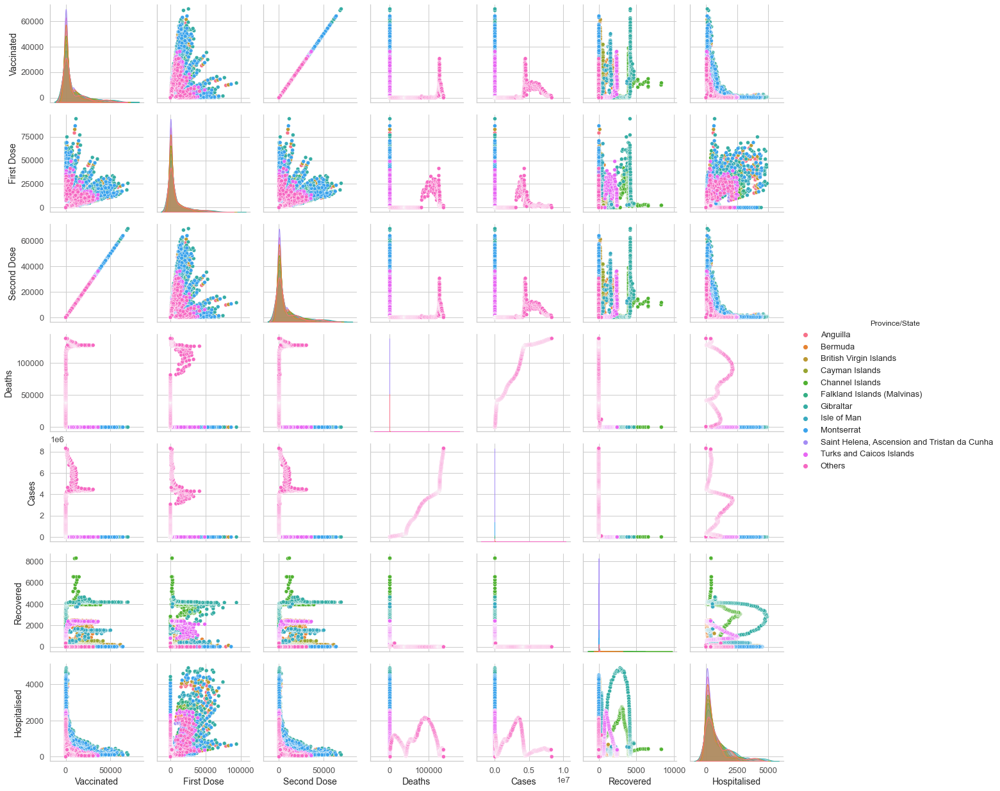

In [99]:
# Import Matplotlib, Seaborn, and Pandas.
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Simple hacks to make plots look better: 

# # Colour pallete to make charts look better.
blue, = sns.color_palette("muted", 1) 

# Darkgrid, white grid, dark, white and ticks.
sns.set_style('whitegrid') 

# Font size of the axes title.
plt.rc('axes', titlesize=18) 

# Font size of the x and y labels.
plt.rc('axes', labelsize=14)    

# Font size of the tick labels.
plt.rc('xtick', labelsize=13,color='#4f4e4e') 

# Font size of the tick labels.
plt.rc('ytick', labelsize=13,color='#4f4e4e')  

# Legend font size.
plt.rc('legend', fontsize=13)

# Controls default text sizes.
plt.rc('font', size=13)    

sns.pairplot(covid_subset, hue = 'Province/State')

#### Objective 1: Create a chart that communicates the number of individuals who have received a second dose compared to individuals who have received their first dose in each area.

In [100]:
#Total first and second dose by province/state
covid_total = covid_subset.groupby('Province/State')[['First Dose', 'Second Dose']].sum().reset_index()

#Calculate the difference between first and second dose 
covid_total['Difference'] = covid_total['First Dose'] - covid_total['Second Dose']

#Calculate the ratio of interest
covid_total['Ratio of interest'] = (covid_total['First Dose'] - covid_total['Second Dose'])*100 / covid_total['First Dose']

covid_total

,Province/State,First Dose,Second Dose,Difference,Ratio of interest
0,Anguilla,4931470,4709072,222398,4.509771
1,Bermuda,2817981,2690908,127073,4.509363
2,British Virgin Islands,5166303,4933315,232988,4.509763
3,Cayman Islands,3522476,3363624,158852,4.509669
4,Channel Islands,3287646,3139385,148261,4.509640
5,Falkland Islands (Malvinas),3757307,3587869,169438,4.509560
6,Gibraltar,5870786,5606041,264745,4.509532
7,Isle of Man,4226984,4036345,190639,4.510048
8,Montserrat,5401128,5157560,243568,4.509577
9,Others,2583151,2466669,116482,4.509299


<AxesSubplot:xlabel='Province/State', ylabel='Ratio of interest'>

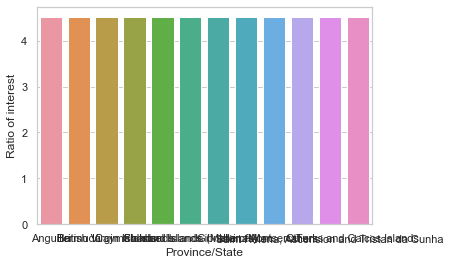

In [101]:
# Import Seaborn
import seaborn as sns

# Set theme
sns.set_theme(style='whitegrid')

# Create a barplot.
sns.barplot(x='Province/State', y='Ratio of interest', data=covid_total)

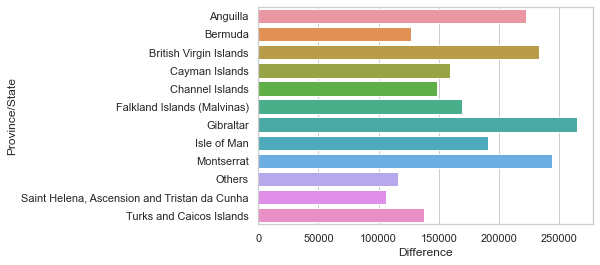

In [102]:
# Import Seaborn
import seaborn as sns

# Set theme
sns.set_theme(style='whitegrid')

# Create a barplot.
difference = sns.barplot(y='Province/State', x='Difference', data=covid_total)

In [103]:
fig = difference.get_figure()
fig.savefig("difference.png") 

#### Objective 2: Create a visualisation that communicates the number of deaths per month in each region. Review the visualisation to determine whether there are areas that hit higher peaks earlier than other areas.

In [104]:
#View data types for covid_subset
print(covid_subset.dtypes)

Province/State            object
Country/Region            object
Date              datetime64[ns]
Vaccinated                 int64
First Dose                 int64
Second Dose                int64
Deaths                   float64
Cases                    float64
Recovered                float64
Hospitalised             float64
dtype: object


In [105]:
#Aggregate death count by Province/State and Date
deaths = covid_subset.groupby(['Province/State'])[['Deaths']].max().sort_values([('Deaths')], ascending=False)

#View deaths data
deaths

,Deaths
Province/State,
Others,138237.0
Channel Islands,100.0
Gibraltar,97.0
Bermuda,95.0
Isle of Man,54.0
British Virgin Islands,37.0
Turks and Caicos Islands,23.0
Cayman Islands,2.0
Anguilla,1.0


TypeError: 'AxesSubplot' object is not subscriptable

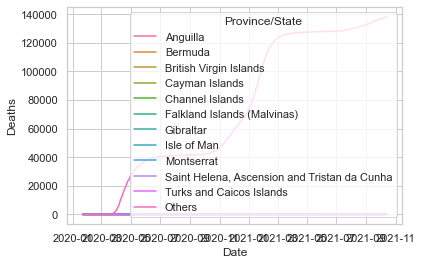

In [111]:
# Create a simple lineplot.
deaths_plot = sns.lineplot(data=covid_subset, x='Date', y='Deaths', hue='Province/State')

deaths_plot['Month']=pd.to_datetime(deaths_plot['Date']+pd.offsets.MonthBegin(0))

In [114]:
deaths.reset_index(inplace=True)

In [115]:
# Filter out 'Others' because it's skewing the data (no reason not working - like Gibralter filter)
deaths_sub = deaths[deaths['Province/State']!='Others']

deaths_sub

,level_0,index,Province/State,Deaths
1,1,1,Channel Islands,100.0
2,2,2,Gibraltar,97.0
3,3,3,Bermuda,95.0
4,4,4,Isle of Man,54.0
5,5,5,British Virgin Islands,37.0
6,6,6,Turks and Caicos Islands,23.0
7,7,7,Cayman Islands,2.0
8,8,8,Anguilla,1.0
9,9,9,Montserrat,1.0
10,10,10,"Saint Helena, Ascension and Tristan da Cunha",1.0


<AxesSubplot:xlabel='Date', ylabel='Deaths'>

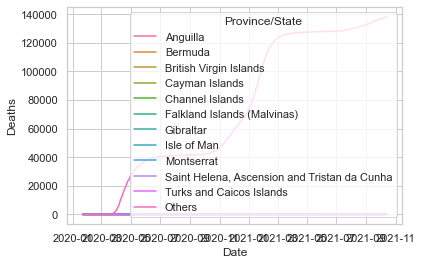

In [122]:
# Create a simple lineplot.
sns.lineplot(data=covid_subset, x='Date', y='Deaths', hue='Province/State')

TypeError: 'AxesSubplot' object is not subscriptable

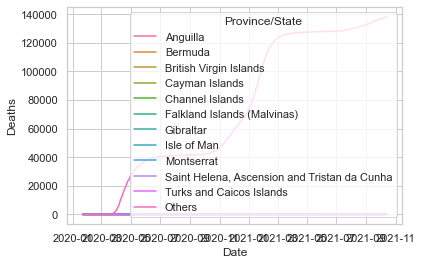

In [117]:
# Create a simple lineplot.
deaths_plot = sns.lineplot(data=covid_subset, x='Date', y='Deaths', hue='Province/State')

deaths_plot['Month']=pd.to_datetime(deaths_plot['Date']+pd.offsets.MonthBegin(0))

#### Objective 3: Identify which region has the greatest number of recoveries. Then, create a visualisation that communicates the number of recoveries per month in each area. Review the visualisation to determine whether this has been consistent over time.

- Group the data by Province/State, and aggregate the count of recovered cases and sort the values of recovered cases in ascending order.
- Convert Date into Months as previously and create a lineplot.
- Group Province/State and Month to aggregate the count of recovered cases.
- Create a lineplot to visualise the trend of recovered cases across the months.
- Save this visualisation in an exported and shareable format (PNG). 
- Dot down some ideas to answer the question posed at the end of this activity.

In [123]:
#Aggregate recoveries count by Province/State and Date
recoveries = covid_subset.groupby('Province/State')[['Recovered']].max() \
.sort_values([('Recovered')], ascending=False) 

#View deaths data
recoveries

,Recovered
Province/State,
Channel Islands,8322.0
Gibraltar,4670.0
Isle of Man,4019.0
Bermuda,2503.0
Turks and Caicos Islands,2433.0
British Virgin Islands,1914.0
Cayman Islands,635.0
Others,344.0
Anguilla,111.0


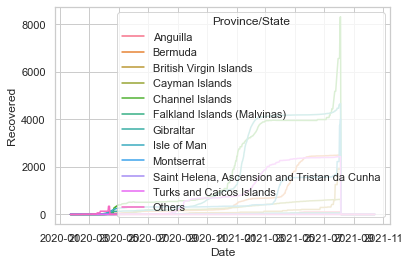

In [124]:
# Create a simple lineplot.
recovered = sns.lineplot(data=covid_subset, x='Date', y='Recovered', hue='Province/State')

In [125]:
fig = recovered.get_figure()
fig.savefig("recovered.png") 

<AxesSubplot:xlabel='Date', ylabel='Hospitalised'>

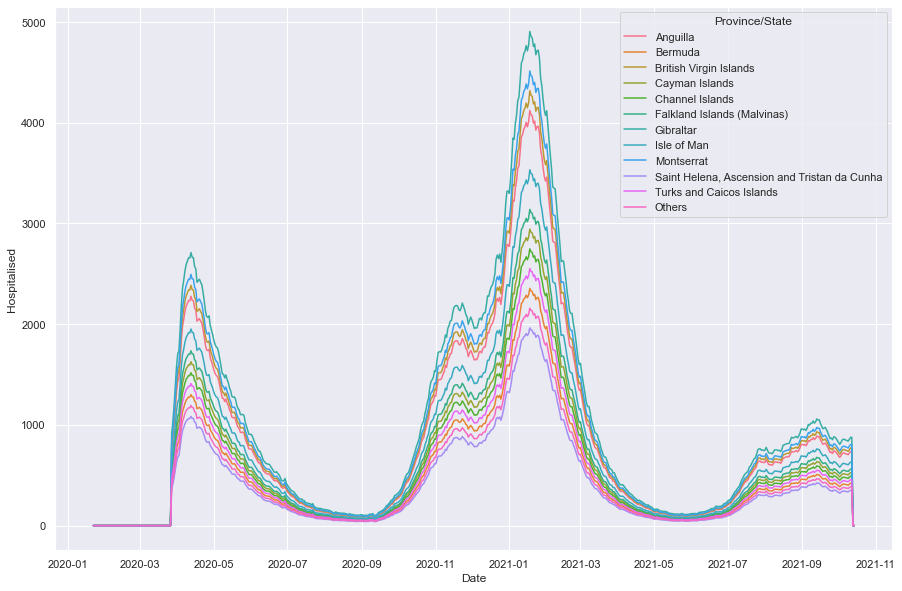

In [138]:
# Create a simple lineplot.
sns.lineplot(data=covid_subset, x='Date', y='Hospitalised', hue='Province/State')

***Notes and observations:***
Your observations here. (Double click to edit)

***Examples could include:***
- Are there other trends in terms of recoveries or hospitalisations compared to other features that you found interesting and that may add value in terms of the decision making process?
- Any other observations regarding the data?
- Any suggestions for improvements and further analysis?
- What would your future data requirements be?

## 5) Assignment activity 5: External data 
In the next section, you were supplied with a sample file and the question was asked to determine whether there are additional `#tags` or keywords that could potentially provide insights into your COVID-19 analysis. While the sample set is limited, you were asked to review the provided file and demonstrate the typical steps and make recommendations regarding future use of similar data sets to provide richer insights.

### 5.1) Report expectations:
- Demonstrate basic ability to work with Twitter data.
- Search for hash-tags or keywords.
- Create DataFrames and visualisations.
- Note your observations.

In [126]:
# Import relevant libraries
import pandas as pd
import seaborn as sns
pd.options.display.max_colwidth = 200
sns.set(rc ={'figure.figsize':(15,10)})

In [127]:
# Import the tweet data set and get info
tweets = pd.read_csv('tweets.csv')

In [128]:
# Explore the data: info(), head()
tweets.info()
tweets.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3960 entries, 0 to 3959
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   created_at                 3959 non-null   object 
 1   id                         3959 non-null   float64
 2   id_str                     3959 non-null   float64
 3   text                       3959 non-null   object 
 4   truncated                  3959 non-null   object 
 5   source                     3959 non-null   object 
 6   in_reply_to_status_id      0 non-null      float64
 7   in_reply_to_status_id_str  0 non-null      float64
 8   in_reply_to_user_id        0 non-null      float64
 9   in_reply_to_user_id_str    0 non-null      float64
 10  in_reply_to_screen_name    0 non-null      float64
 11  contributors               0 non-null      float64
 12  is_quote_status            3959 non-null   object 
 13  retweet_count              3960 non-null   int64

,created_at,id,id_str,text,truncated,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,...,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,lang,possibly_sensitive,quoted_status_id,quoted_status_id_str
0,23/05/2022,1.528750e+18,1.528750e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
1,23/05/2022,1.528720e+18,1.528720e+18,"#COVID19 is linked to more #diabetes diagnoses in kids, CDC study finds https://t.co/H5lO1W7Skd via @YouTube",False,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,1,False,False,en,False,NaN,NaN
2,23/05/2022,1.528650e+18,1.528650e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
3,23/05/2022,1.528610e+18,1.528610e+18,"READ MY NEW OP-ED: IRREVERSIBLE – Many Effects Of COVID19 Are Permanent\nEvidence shows that COVID19 may cause extreme damage to the brain, kidneys, lungs, liver, heart, &amp; can cause amputation...",False,"<a href=""https://www.socialjukebox.com"" rel=""nofollow"">The Social Jukebox</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN
4,23/05/2022,1.528600e+18,1.528600e+18,Advanced healthcare at your fingertips\nhttps://t.co/aUQ93qFsJ4 | +443333053358\n#slough #sloughtownfc #sloughtown #sloughi #windsor #windsorcastle #diabetes #physician #generalphysician\n#hospita...,False,"<a href=""https://about.twitter.com/products/tweetdeck"" rel=""nofollow"">TweetDeck</a>",NaN,NaN,NaN,NaN,...,NaN,False,0,0,False,False,en,False,NaN,NaN


In [129]:
# Explore the structure, count the tweets, get the elements of interest

In [130]:
tweets.retweet_count.value_counts()

0       2818
1        570
2        190
3         96
4         54
5         33
6         29
7         17
8         14
11        10
14        10
10         9
9          8
17         8
21         6
12         6
19         5
13         5
16         5
28         4
44         3
27         3
23         3
15         3
37         3
38         2
107        2
54         2
67         2
43         2
25         2
65         1
63         1
48         1
85         1
29         1
30         1
22         1
130        1
89         1
398        1
18         1
32         1
466        1
112        1
90         1
319        1
253        1
116        1
304        1
60         1
79         1
1565       1
369        1
56         1
42         1
118        1
199        1
195        1
963        1
24         1
31         1
49         1
33         1
261        1
212        1
52         1
Name: retweet_count, dtype: int64

In [160]:
tweets.favorite_count.value_counts()

0       2240
1        682
2        252
3        174
4        100
5         75
6         51
7         39
8         38
9         24
10        22
11        16
13        15
12        13
17        12
14        12
24        11
15        11
18         8
16         8
25         7
19         7
22         6
29         5
20         5
23         5
21         5
30         4
39         3
31         3
26         3
40         3
53         3
242        2
27         2
81         2
32         2
47         2
48         2
45         2
89         2
43         2
70         2
33         2
185        2
28         2
65         2
181        1
57         1
71         1
293        1
145        1
621        1
837        1
80         1
149        1
909        1
2251       1
44         1
4376       1
1003       1
66         1
140        1
264        1
72         1
3496       1
649        1
766        1
722        1
79         1
317        1
228        1
85         1
169        1
183        1
147        1
582        1

Norah's conclusion is dataset is too small to make meaningful use of retweets and favourite counts, but these could be useful in the future

In [131]:
# Create a DataFrame with the text only
tweets['text'] = tweets['text'].astype(str)
tweets_text = tweets['text'].apply(lambda x: x if x.strip() !=None else None)

In [132]:
# Loop through the messages and build a list of values containing the #-symbol
tags = []
for y in [x.split(' ') for x in tweets_text.values]:
    for z in y:
        if '#' in z:
            tags.append(z)
            
# Create a Series containing only the value counts in our list
tags=pd.Series(tags).value_counts()


In [133]:
# Filter and sort - display the first 30
tags.head(30)

#COVID19                1632
#CovidIsNotOver          472
#China                   262
#covid19                 176
#Covid19                 148
#COVID                   108
#covid                   104
#Greece                  103
#coronavirus             100
#PeoplesVaccine.          84
#CoronaUpdate             84
#Omicron                  83
#COVID2020                82
#covid19uk                80
#CoronavirusOutbreak      80
#COVID19Pandemic          80
#monkeypox                77
#globalhealth             76
#publichealth             72
#healthtech               69
#COVID2019                69
#datascience              66
#data                     66
#analytics                64
#Shanghai                 63
#Covid_19                 63
#datavisualization        63
#pandemic                 60
#Athens                   55
#Beijing                  50
dtype: int64

In [134]:
# Convert the series to a dataframe in preparation for a visualisation
data = pd.DataFrame(tags).reset_index()

#Rename the columns
data.columns = ['word', 'count']

#Fix the data types
data['count'] = data['count'].astype(int)
data

,word,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103
8,#coronavirus,100
9,#PeoplesVaccine.,84


In [136]:
#Display records where count is larger than 100
display(data.loc[(data['count']>100)])

,word,count
0,#COVID19,1632
1,#CovidIsNotOver,472
2,#China,262
3,#covid19,176
4,#Covid19,148
5,#COVID,108
6,#covid,104
7,#Greece,103


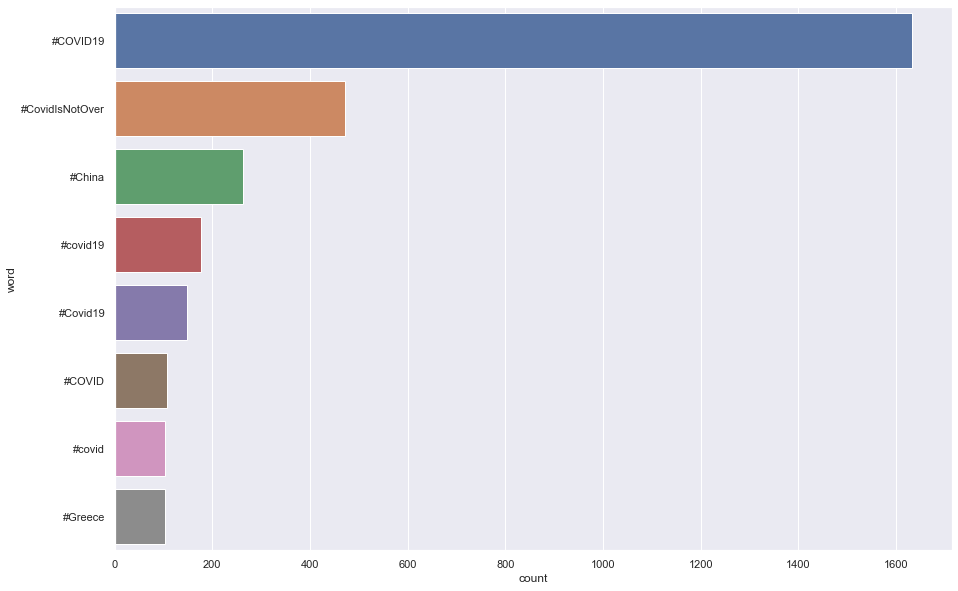

In [137]:
# Plot the records as barplot where the count is larger than 100 (with y set to 'words')
ax = sns.barplot(x='count',y='word', data=data.loc[(data['count']>100)])


In [168]:
# Manual list of stopwords to be removed for text analysis
sw_list = ['a', 'about', 'actually', 'almost', 'also', 'although', 'always', 'am', 'an', 'and',
          'any', 'are', 'as', 'at', 'be', 'been', 'being', 'became', 'become', 'but', 'by', 'can', 'could', 'did',
          'do', 'does', 'each', 'either', 'else', 'for', 'from', 'had', 'has', 'have', 'hence',
          'how', 'get', 'i', 'if', 'in', 'is', 'it', 'its', 'just', 'like', 'may', 'maybe', 'me', 'might', 'mine',
          'must', 'my', 'neither', 'nor', 'not', 'of', 'oh', 'ok', 'when', 'whenever', 'where', 
           'whereas', 'wherever', 'whether', 'which', 'while', 'who', 'whoever', 'whom', 'whose',
          'why', 'will', 'with', 'within', 'without', 'would', 'yes', 'yet', 'you', 'your', 'to',
          'the', 'of', 'and', 'are', 'was', 'were', 'this', 'on', 'now', 'over', 'us', 'so', 'more',
          'our', 'they', 'their', 'we', 'after', 'or', 'no', 'still', 'day', 'out', 'our', 'one', 'all',
          '&amp;', "-", "|", "that", " "]


In [169]:
# Convert the text of the tweets to a list of tweets
tweets_text_values = tweets_text.values

# Convert each of the tweets to a list of words
tweets_text_values_words = [x.split(' ') for x in tweets_text_values]

# Create empty list
tweets_text_values_words_all = []

# Append to the list and remove http, mentions and selected words
tweets_text_values_words_all = [z for y in tweets_text_values_words for z in y if 'http' not in z and not z.startswith(("@", "#")) and z.lower() not in sw_list]
tweets_text_values_words_all = pd.Series(tweets_text_values_words_all).value_counts()

In [170]:
# Display the first 50 entries of the Series
tweets_text_values_words_all.head(50)

               1738
Covid           348
people          303
Greece          275
COVID-19        267
cases           228
Athens,         211
Athens          209
new             205
COVID           198
Covid-19        153
vaccine         147
COVID19         143
up              142
China           141
covid           140
per             126
I’m             125
way             124
cause           118
New             111
safe            111
via             110
first           108
pandemic        106
Please          104
join            100
until           100
–                99
during           99
than             98
said             97
protection       96
reported         95
Coronavirus      94
sign             91
Deaths           90
safe.            90
Health           89
positive         88
stand            87
denied           86
2022             86
urgently         86
urging           86
some             86
everyone’s       85
•                85
health           85
petition.        84


In [171]:
# Use the Series to create a dataframe in preparation for visualisation
data2 = pd.DataFrame(tweets_text_values_words_all.head(16)).reset_index()

# Rename the columns
data2.columns = ['word', 'count']

In [172]:
# Strip out blank spaces and display the results
data2 = data2[data2['word'].str.strip('word') !='']
data2

,word,count
1,Covid,348
2,people,303
3,Greece,275
4,COVID-19,267
5,cases,228
6,"Athens,",211
7,Athens,209
8,new,205
9,COVID,198
10,Covid-19,153


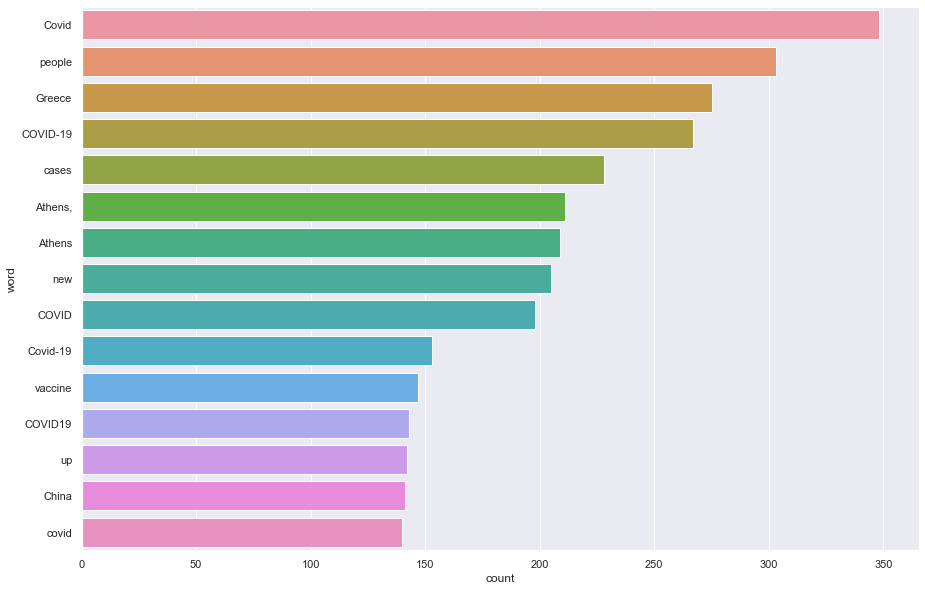

In [173]:
# Plot the data as a horizontal barplot
ax = sns.barplot(x='count', y='word', data=data2)

In [174]:
#Review content of tweets containing selected keywords - 'cases' and 'risk'
dft = pd.DataFrame(tweets_text_values)
dft.columns = ['Tweets']

In [175]:
#Create a subset of the dataframe containing only tweets with identified keywords
subset = dft[dft['Tweets'].str.contains('cases', 'risk')]

# Loop through the dataframe and print each element
for i in subset.index:
    print('Tweet: ',i)
    print(subset.loc[i,'Tweets'], '\n')

Tweet:  38
More than 90% of those infected with COVID-19 show no symptoms
but the rest of the infected cases had either Type 2 diabetes, cardiovascular diseases, hypertension, and/or cancer, which means people with obesity  show severe symptoms.
#paraphrase
#COVID19
https://t.co/ZEtNx7f4jE 

Tweet:  65
The CDC investigates mysterious cases of #PediatricHepatitis. Find out about this and more, including stories on diabetes' effect on #COVID19 outcomes and prioritization of future #cancer prevention for adolescent and young adult cancer survivors.
https://t.co/VlHgXy6Afg 

Tweet:  77
Pregnant women have a low risk of having severe symptoms; however, in some cases -- especially those with obesity or gestational diabetes, or who are old, or who have underlying diseases -- they may have severe symptoms. 

#COVID19 https://t.co/4SG3GAMx04 

Tweet:  190
Public Health Ontario's latest data on #COVID19 cases in ON, incl TO, is now available: https://t.co/oUxcc69p2S. 

TPH's case counts dashboar

### 5.2) Presentation expectations:
Discuss whether external data could potentially be used and whether it is a viable solution to pursue. Discuss your assumptions and suggestions. 

Points to consider:
- What insights can be gained from the data?
- What are the advantages and disadvantages of using external data?
- How would you suggest using external data in the project?

## 6) Assignment activity 6: 

### 6.1) Report expectations:
- Demonstrate using external function and interpret results.
- Note observations.

**See separate notebook:** LSE_DA201_Week_6_assignment_notebook_Nikki_Stopford

### 6.2) Presentation expectations:
- **Question 1**: We have heard of both qualitative and quantitative data from the previous consultant. What are the differences between the two? Should we use only one or both of these types of data and why? How can these be used in business predictions? Could you provide examples of each?
- **Question 2**: We have also heard a bit about the need for continuous improvement. Why should this be implemented, it seems like a waste of time. Why can’t we just implement the current project as it stands and move on to other pressing matters?
- **Question 3**: As a government, we adhere to all data protection requirements and have good governance in place. We only work with aggregated data and therefore will not expose any personal details. Have we covered everything from a data ethics standpoint? Is there anything else we need to implement from a data ethics perspective? 